# LoRaWAN localization project

# 1. Introduction

This is my bachelor project at AmirKabir University of Technology.

In this project I'm working on a dataset of RSSI(Receieved Signal Strength Indicator) measures that I have gatherd in the campus from 3 LoRaWAN gateways. as you can see in the following picture, the covered area is in the form of a triangle with an approximate area of 12 square kilometers.

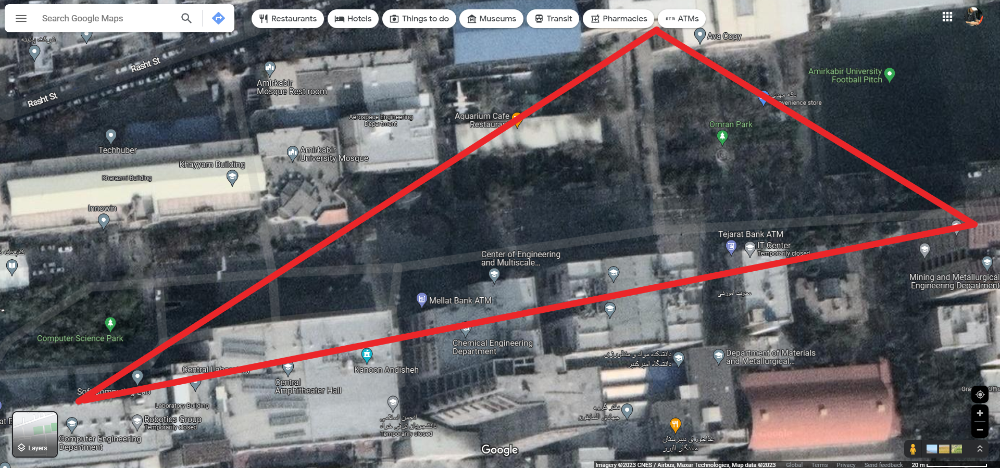

The goal of this project is to develope a system for localization based on LoRaWAN infrastructure. So, first of all we need to setup a LoRaWAN network using Gateways

As I mentioned before the network infrastructure was established in the campus. The gateways where placed in:
1. Computer Engineering Department
2. Civil Faculty
3. mining Engineering Department

after setting up the network I used a LoRa end-device node, that I have built to gather data and to create a data-set. The end-device is shown in the picture below. the end device contains from 5 main parts:

1. proccessor: arduino pro mini
2. LoRa phy layer: LoRa Hope
3. power source: 1 cell of lithium polymer battery with 1000mah
4. antena: 915Mhz antena and an antena conector (the yellow connector between antena and the pcb in the picture below). 
5. main pcb: this pcb is an interface to connect proccessor and LoRa module in a sufficent way. I used the following github link  for the pcb https://github.com/CongducPham/LowCostLoRaGw

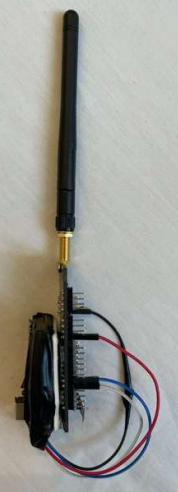

## 1.1 How it works

The data-set of RSSI measures are going to be fed into some AI machine learning algorithms. these algorithms helps us to locate the approximate position of the end-device in the mentioned area.

## 1.2 Used Algorithms:
Supervised:
1. KNN
2. SVM
3. MLP
4. XGBoost
    
Unsupervised:
1. Kmeans
2. Fuzzy clustering

## 1.3 Data-set
ِData are discrete numbers in range of -30 to -120. These numbers indicates the strength of a received signal from the end-device to the Gateway. The more negative the RSSI of a signal is, the weaker it is. in the data-set -120 means the signal never reached the gateway.

In order to gather data, I Divided the covered area into 7 regions as shown in the image below. this regions are used as the ground-truth for the supervised learning techniques.


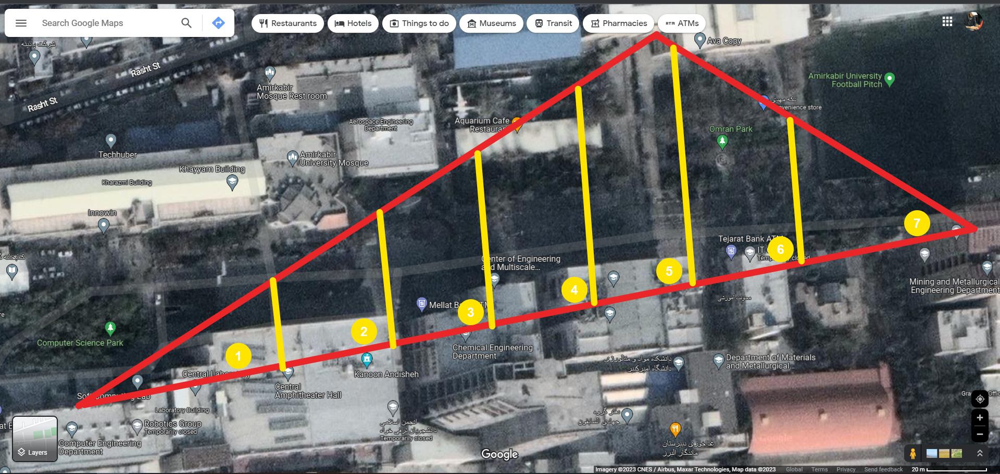

# 2 view, describe and pre-proccessing Data

1. importing data-set
2. view data
3. create a temporary data-set for manipulation (because we dont want to modify the raw data-set)
4. describe data
5. filtering and cleaning data: α−β−γ filter

## 2.1 importing data-set

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [12]:
# import data-set
raw_dataFrame = pd.read_csv("./data_set/dataCsv.csv")

## 2.2 view Data

In [13]:
raw_dataFrame.iloc[250:260]

,region,comp,civil,mining
250,4,-83,-85,-90
251,4,-81,-81,-89
252,4,-85,-83,-87
253,4,-84,-85,-89
254,4,-87,-88,-91
255,4,-83,-86,-91
256,4,-81,-85,-93
257,4,-91,-87,-87
258,4,-90,-84,-89
259,4,-89,-85,-85


In [14]:
raw_dataFrame

,region,comp,civil,mining
0,1,-72,-120,-95
1,1,-79,-120,-120
2,1,-83,-91,-97
3,1,-75,-88,-120
4,1,-75,-89,-120
...,...,...,...,...
495,7,-120,-84,-83
496,7,-120,-81,-80
497,7,-97,-83,-79
498,7,-120,-85,-75


In [15]:
raw_dataFrame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   region  500 non-null    int64
 1   comp    500 non-null    int64
 2   civil   500 non-null    int64
 3   mining  500 non-null    int64
dtypes: int64(4)
memory usage: 15.8 KB


## 2.3 creating temporary data frame
I am doing this because i dont want to modify the main data-set

In [16]:
raw_dataFrame.to_csv("./data_set/modifiable-df.csv")
df = pd.read_csv("./data_set/modifiable-df.csv", index_col = 0)

### shuffling data

In [17]:
def shuffle_data(df):
    # shuffleing the whole data set
    df = df.sample(frac=1).reset_index()
    # sorting the data set in respect to region column
    df = df.sort_values(by=['region'], ascending=True).reset_index()
    # removing some redundant column that the previous actions made
    df.drop("index", inplace=True, axis=1)
    df.drop("level_0", inplace=True, axis=1)
    return df

In [18]:
df = shuffle_data(df)
df

,region,comp,civil,mining
0,1,-75,-97,-120
1,1,-85,-93,-95
2,1,-74,-120,-95
3,1,-91,-89,-120
4,1,-81,-93,-120
...,...,...,...,...
495,7,-95,-85,-83
496,7,-93,-89,-81
497,7,-95,-85,-75
498,7,-91,-91,-73


## 2.4 describe data

In [19]:
df.describe()

,region,comp,civil,mining
count,500.000000,500.000000,500.000000,500.000000
mean,3.980000,-92.062000,-88.830000,-91.878000
std,1.972659,14.254562,11.078021,13.110411
min,1.000000,-120.000000,-120.000000,-120.000000
25%,2.000000,-94.000000,-91.000000,-93.000000
50%,4.000000,-89.000000,-87.000000,-89.000000
75%,6.000000,-83.000000,-84.000000,-83.000000
max,7.000000,-69.000000,-69.000000,-71.000000


In [20]:
df.corr()

,region,comp,civil,mining
region,1.000000,-0.667468,0.511861,0.711429
comp,-0.667468,1.000000,-0.378761,-0.481930
civil,0.511861,-0.378761,1.000000,0.410407
mining,0.711429,-0.481930,0.410407,1.000000


<Axes: >

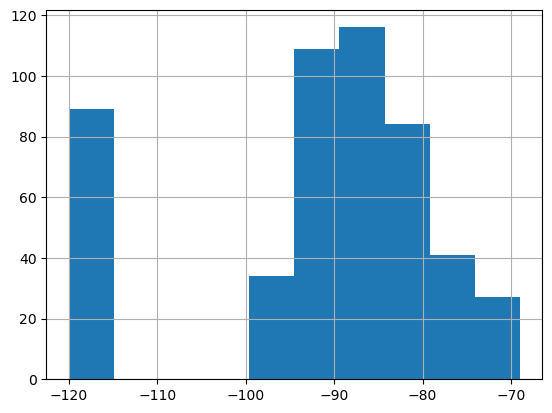

In [21]:
df["comp"].hist()

<Axes: >

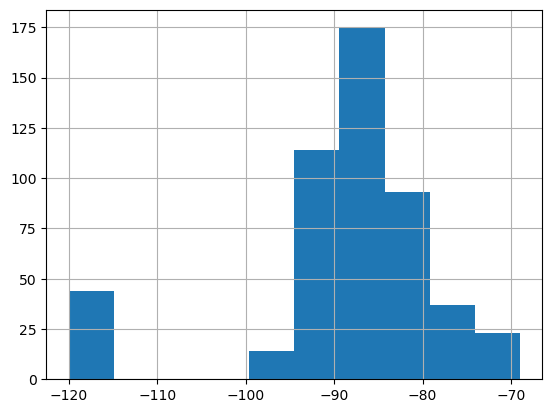

In [22]:
df["civil"].hist()

<Axes: >

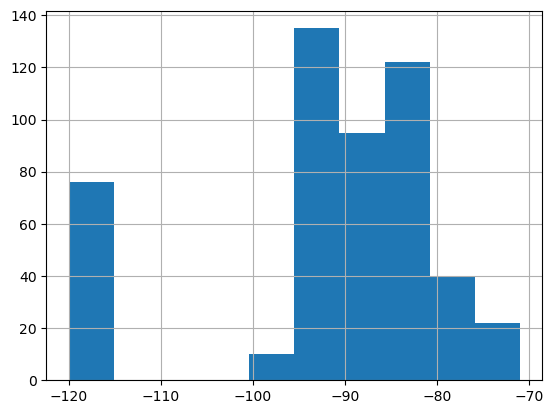

In [23]:
df["mining"].hist()

In [24]:
df.mean()

region     3.980
comp     -92.062
civil    -88.830
mining   -91.878
dtype: float64

In [25]:
# display RSSI mean of all the gateways in each of the 7 regions
def get_regions_mean():
    means = []
    comp_means = []
    civil_means = []
    mining_means = []
    for i in range(1,8):
        region_i_means = df[df["region"] == i].mean()
        comp_means.append(region_i_means.comp)
        civil_means.append(region_i_means.civil)
        mining_means.append(region_i_means.mining)
    means.append(comp_means)
    means.append(civil_means)
    means.append(mining_means)
    return means
    

In [26]:
# display RSSI mean of all the gateways in each of the 7 regions
def display_regions_mean():
    for i in range(1,8):
        region_i_means = df[df["region"] == i].mean()
        print(region_i_means)
display_regions_mean()

region      1.000000
comp      -77.362319
civil    -100.623188
mining   -109.463768
dtype: float64
region     2.000000
comp     -82.811594
civil    -96.115942
mining   -98.275362
dtype: float64
region     3.000000
comp     -87.493671
civil    -90.303797
mining   -95.962025
dtype: float64
region     4.000000
comp     -91.328947
civil    -86.526316
mining   -90.618421
dtype: float64
region     5.000000
comp     -98.115942
civil    -79.376812
mining   -86.391304
dtype: float64
region      6.000000
comp     -102.014493
civil     -82.304348
mining    -83.869565
dtype: float64
region      7.000000
comp     -106.043478
civil     -86.579710
mining    -78.101449
dtype: float64


In [27]:
# retuerns all the gateway-region RSSI values. all the RSSI values of each gateway in each region
# returns a 2D list [3][7]
# the first dimension are gateways(comp, civil, mining). (the gateways are also the columns of data set and main features of this task)
# second dimension are the 7 regions
def get_regionGateway_info(df):
    gateways = []
    comp = []
    civil = []
    mining = []
    for i in range(1,8):
        comp.append(df[df["region"] == i]["comp"])
        civil.append(df[df["region"] == i]["civil"])
        mining.append(df[df["region"] == i]["mining"])
    gateways.append(comp)
    gateways.append(civil)
    gateways.append(mining)
    return gateways

In [28]:
# plot the chosen gateway-region histogram
# gateway: 0=comp, 1=civil, 2=minig
# region: 1 ~ 7
def display_single_regionGateway_histogram(gateway, region):
    if region == 0 or region > 7:
        print("wrong input!!, select region from 1 to 7")
    if gateway < 0 or gateway > 3:
        print("wrong input!!, select gateway from 0, 1 or 2")
    region -= 1
    plt.hist(gateways[gateway][region])
    plt.show()

In [29]:
# plot of all the regions from the perspective of the chosen gateway
# gateway: 0=comp, 1=civil, 2=minig
def display_all_regions_of_gateway_plot(df, gateway):
    gateway_names = ["comp", "civil", "mining"]
    gateways = get_regionGateway_info(df)
    figure, axis = plt.subplots(7, 1, figsize=(7, 22))

    # For comp gateway region 1
    axis[0].plot(gateways[gateway][0])
    axis[0].set_title(gateway_names[gateway] + " region 1")
    # For comp gateway region 2
    axis[1].plot(gateways[gateway][1])
    axis[1].set_title(gateway_names[gateway] + " region 2")
    # For comp gateway gateways 3
    axis[2].plot(gateways[gateway][2])
    axis[2].set_title(gateway_names[gateway] + " region 3")
    # For comp gateway region 4
    axis[3].plot(gateways[gateway][3])
    axis[3].set_title(gateway_names[gateway] + " region 4")
    # For comp gateway region 5
    axis[4].plot(gateways[gateway][4])
    axis[4].set_title(gateway_names[gateway] + " region 5")
    # For comp gateway region 6
    axis[5].plot(gateways[gateway][5])
    axis[5].set_title(gateway_names[gateway] + " region 6")
    # For comp gateway region 7
    axis[6].plot(gateways[gateway][6])
    axis[6].set_title(gateway_names[gateway] + " region 7")

    # Combine all the operations and display
    plt.show()

In [30]:
# plot histogam of all the regions from the perspective of the chosen gateway
# gateway: 0=comp, 1=civil, 2=minig
def display_all_regions_of_gateway_histogram(df, gateway):
    gateway_names = ["comp", "civil", "mining"]
    gateways = get_regionGateway_info(df)
    figure, axis = plt.subplots(7, 1, figsize=(7, 22))

    # For comp gateway region 1
    axis[0].hist(gateways[gateway][0])
    axis[0].set_title(gateway_names[gateway] + " region 1")
    # For comp gateway region 2
    axis[1].hist(gateways[gateway][1])
    axis[1].set_title(gateway_names[gateway] + " region 2")
    # For comp gateway gateways 3
    axis[2].hist(gateways[gateway][2])
    axis[2].set_title(gateway_names[gateway] + " region 3")
    # For comp gateway region 4
    axis[3].hist(gateways[gateway][3])
    axis[3].set_title(gateway_names[gateway] + " region 4")
    # For comp gateway region 5
    axis[4].hist(gateways[gateway][4])
    axis[4].set_title(gateway_names[gateway] + " region 5")
    # For comp gateway region 6
    axis[5].hist(gateways[gateway][5])
    axis[5].set_title(gateway_names[gateway] + " region 6")
    # For comp gateway region 7
    axis[6].hist(gateways[gateway][6])
    axis[6].set_title(gateway_names[gateway] + " region 7")

    # Combine all the operations and display
    plt.show()

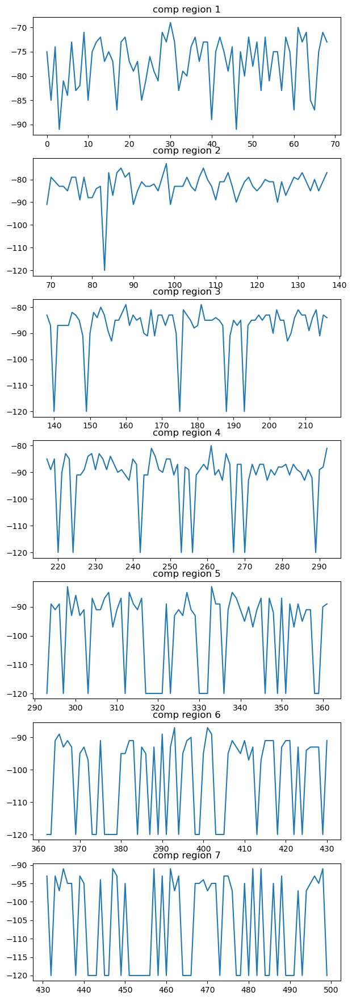

In [32]:
display_all_regions_of_gateway_plot(df, 0)

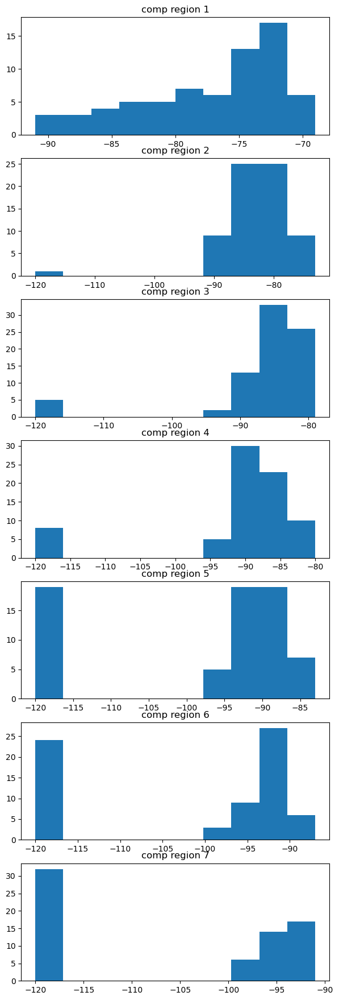

In [33]:
display_all_regions_of_gateway_histogram(df, 0)

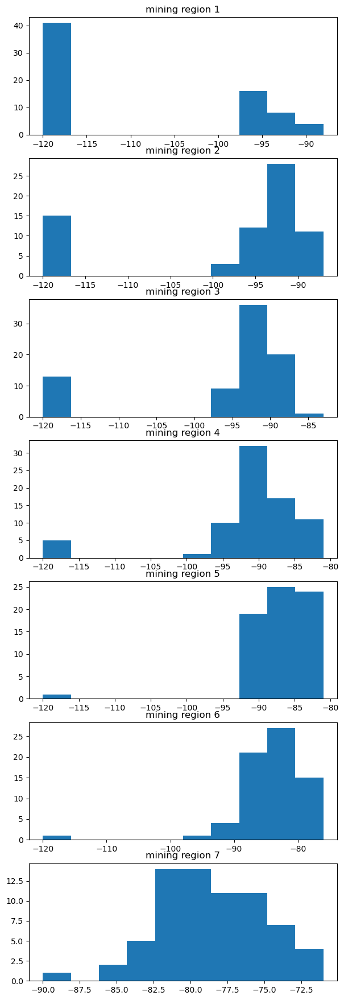

In [31]:
display_all_regions_of_gateway_histogram(df, 2)

## 2.5 cleaning and filtering data
in this section I am using a simple version of kalman filter name α−β−γ to filter the data.

the reason behind this is that, the RSSI values are very noisy and affected by a lot of noises in the environment.
so we use filters to minimise the effect of noises on the data.

I used the following equation to filter the data:

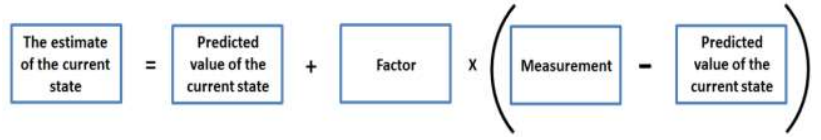

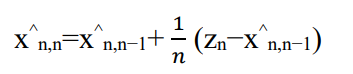

x         is the true value of the weight

zn        is the measured value of the weight at time n

x^n,n     is the estimate of x at time n (the estimate is made after taking the measurement zn)

x^n+1,n   is the estimate of the future state (n+1) of x. The estimate is made at the time n. In other words, x^n+1,n is a predicted state or extrapolated state

x^n,n−1 is a prior prediction - the estimate of the state at time n. The estimate is made at the time n−1

The term (zn − x^n,n−1) is the "measurement residual," also called innovation. The innovation contains new information.

In this example, 1/n decreases as n increases. In the beginning, we don't have enough information about the current state; thus, the first estimation is based on the first measurement 1/n|n=1 = 1

As we continue, each successive measurement has less weight in the estimation process, since 1/n decreases. At some point, the contribution of the new measurements will become negligible.

https://www.kalmanfilter.net/background.html

The schematic of the filter used is as follows:

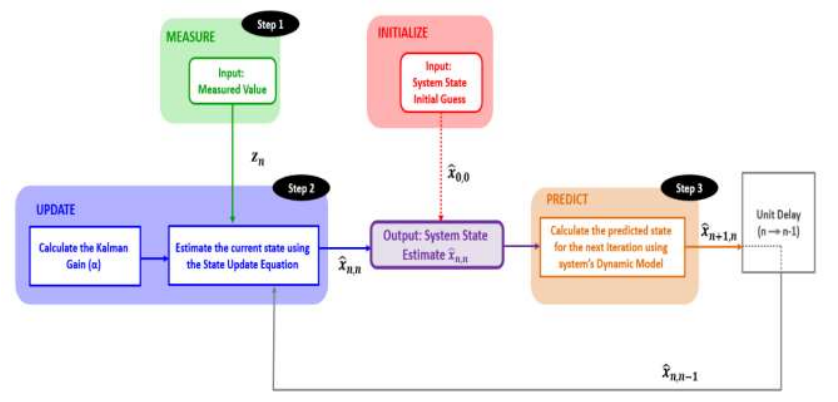

## initial values

In [32]:
number_of_regions = 7
number_of_gateways = 3
list_of_gateways = ['comp', 'civil', 'mining']
number_of_rows_in_region = []
for i in range(1, 8):
    number_of_rows_in_region.append(len(df[df['region'] == i]))

In [33]:
def alpha_beta_gama(z, initial_guess, number_of_values):
    x = [0] * number_of_values
    x[0] = initial_guess
    for n in range(1, number_of_values):
        if n >= 10:
            kn = 1/10
        else:
            kn = 1/n
        # z[n-1] is z[n] here
        x[n] = x[n-1] + ( kn * (z[n-1] - x[n-1]))
    return x
    

In [34]:
rssi_values = get_regionGateway_info(df)
filtered_values = []
means = get_regions_mean()
def _filter():
    filtered_rssi_values = []
    for region in range(number_of_regions):
        regional_filtered_rssi_values = []
        for gateway in range(number_of_gateways):
            initial_guess = means[gateway][region]
            z = list(rssi_values[gateway][region])
            x = alpha_beta_gama(z, initial_guess, number_of_rows_in_region[region])
            regional_filtered_rssi_values.append(x)
        filtered_rssi_values.append(regional_filtered_rssi_values)
        
    return filtered_rssi_values
           

In [35]:
filtered_rssi_values = _filter()

In [36]:
data = []
for region in range(number_of_regions):
    for i in range(number_of_rows_in_region[region]):
        row = [region+1, filtered_rssi_values[region][0][i], filtered_rssi_values[region][1][i], filtered_rssi_values[region][2][i]]
        data.append(row)

## creating a csv file from filtered data

In [37]:
filtered_df = pd.DataFrame(data, columns=['region', 'comp', 'civil', 'mining'])
filtered_df

,region,comp,civil,mining
0,1,-77.362319,-100.623188,-109.463768
1,1,-80.000000,-89.000000,-120.000000
2,1,-76.500000,-104.500000,-120.000000
3,1,-75.333333,-100.000000,-120.000000
4,1,-74.500000,-105.000000,-120.000000
...,...,...,...,...
495,7,-105.307697,-86.102838,-78.386012
496,7,-106.776927,-85.892555,-78.447411
497,7,-108.099234,-86.003299,-78.102670
498,7,-106.789311,-85.902969,-78.392403


In [38]:
# display_all_regions_of_gateway_histogram(filtered_df, 1)

In [39]:
filtered_df.to_csv("./data_set/filtered-df.csv")

In [57]:
# plot the difference of raw data and filtered data in all the regions from the perspective of the chosen gateway
# gateway: 0=comp, 1=civil, 2=minig
def display_filtered_comparison(gateway):
    gateway_names = ["comp", "civil", "mining"]
    raw = get_regionGateway_info(df)
    filtered = get_regionGateway_info(filtered_df)
    figure, axis = plt.subplots(7, 1, figsize=(7, 22))

    # For comp gateway region 1
    axis[0].plot(raw[gateway][0], label='measurments')
    axis[0].plot(filtered[gateway][0], label='estimation')
    axis[0].set_title(gateway_names[gateway] + " region 1")
    axis[0].legend()
    # For comp gateway region 2
    axis[1].plot(raw[gateway][1], label='measurments')
    axis[1].plot(filtered[gateway][1], label='estimation')
    axis[1].set_title(gateway_names[gateway] + " region 2")
    axis[1].legend()
    # For comp gateway gateways 3
    axis[2].plot(raw[gateway][2], label='measurments')
    axis[2].plot(filtered[gateway][2], label='estimation')
    axis[2].set_title(gateway_names[gateway] + " region 3")
    axis[2].legend()
    # For comp gateway region 4
    axis[3].plot(raw[gateway][3], label='measurments')
    axis[3].plot(filtered[gateway][3], label='estimation')
    axis[3].set_title(gateway_names[gateway] + " region 3")
    axis[3].legend()
    # For comp gateway region 5
    axis[4].plot(raw[gateway][4], label='measurments')
    axis[4].plot(filtered[gateway][4], label='estimation')
    axis[4].set_title(gateway_names[gateway] + " region 5")
    axis[4].legend()
    # For comp gateway region 6
    axis[5].plot(raw[gateway][5], label='measurments')
    axis[5].plot(filtered[gateway][5], label='estimation')
    axis[5].set_title(gateway_names[gateway] + " region 6")
    axis[5].legend()
    # For comp gateway region 7
    axis[6].plot(raw[gateway][6], label='measurments')
    axis[6].plot(filtered[gateway][6], label='estimation')
    axis[6].set_title(gateway_names[gateway] + " region 7")
    axis[6].legend()

    # Combine all the operations and display
    plt.show()

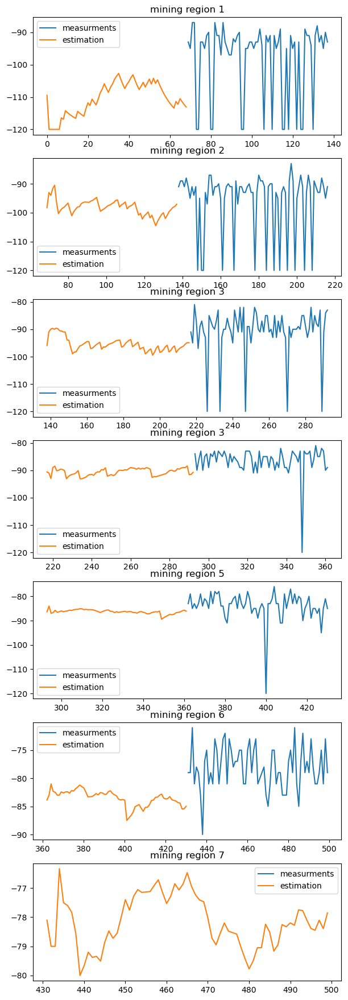

In [58]:
display_filtered_comparison(2)

# 3 localization using machine learning algorithms

In this section I am going to implement the following techniques.

1. supervised learning techniques:
   1. knn
   2. svm
   3. XGBoost
   4. lmp
2. unsupervised learning techniques:
   1. fuzzy clustering
   2. Kmeans
   
After implementing the algorithms I am going to use both raw-data and filtered-data with them. At the end I will compare the results of each techniques to see the which algorithm is working better and whether filtering has a good effect on the results or not.

## 3.1 supervised learning algorithms on raw data:

### importing libraries

In [59]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score, confusion_matrix
import matplotlib.pyplot as plt

### Load the data

In [83]:
df = pd.read_csv("./data_set/modifiable-df.csv", index_col = 0)
df = shuffle_data(df)
df

,region,comp,civil,mining
0,1,-87,-95,-93
1,1,-74,-89,-120
2,1,-81,-94,-120
3,1,-85,-93,-95
4,1,-87,-90,-120
...,...,...,...,...
495,7,-93,-87,-75
496,7,-120,-90,-78
497,7,-95,-93,-81
498,7,-95,-84,-90


### plotting the whole data-set

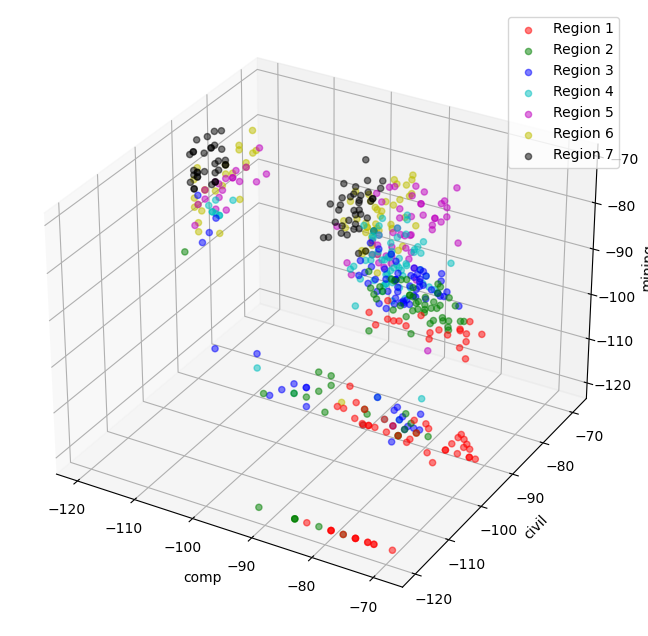

In [84]:
from mpl_toolkits.mplot3d import Axes3D

# Extract the features and target
X = df[['comp', 'civil', 'mining']]
y = df['region']

# Create a 3D scatter plot
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k']
for i, region in enumerate(y.unique()):
    ax.scatter(X[y == region]['comp'], X[y == region]['civil'], X[y == region]['mining'], 
               c=colors[i], label=f"Region {region}", alpha=0.5)

# Set the axis labels
ax.set_xlabel('comp')
ax.set_ylabel('civil')
ax.set_zlabel('mining')

# Set the legend
ax.legend()

# Show the plot
plt.show()

### applying algorithms

KNN


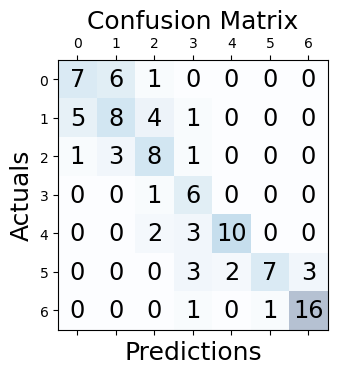

Confusion Matrix:
 [[ 7  6  1  0  0  0  0]
 [ 5  8  4  1  0  0  0]
 [ 1  3  8  1  0  0  0]
 [ 0  0  1  6  0  0  0]
 [ 0  0  2  3 10  0  0]
 [ 0  0  0  3  2  7  3]
 [ 0  0  0  1  0  1 16]]
F1 Score: 0.6229
Precision Score: 0.6609
Recall Score: 0.6200
Accuracy Score: 0.6200

SVM


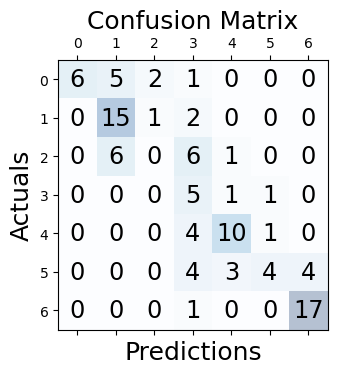

Confusion Matrix:
 [[ 6  5  2  1  0  0  0]
 [ 0 15  1  2  0  0  0]
 [ 0  6  0  6  1  0  0]
 [ 0  0  0  5  1  1  0]
 [ 0  0  0  4 10  1  0]
 [ 0  0  0  4  3  4  4]
 [ 0  0  0  1  0  0 17]]
F1 Score: 0.5441
Precision Score: 0.6048
Recall Score: 0.5700
Accuracy Score: 0.5700

Neural Network


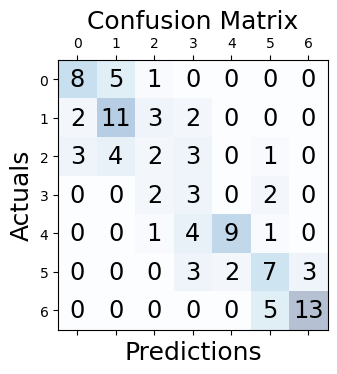

Confusion Matrix:
 [[ 8  5  1  0  0  0  0]
 [ 2 11  3  2  0  0  0]
 [ 3  4  2  3  0  1  0]
 [ 0  0  2  3  0  2  0]
 [ 0  0  1  4  9  1  0]
 [ 0  0  0  3  2  7  3]
 [ 0  0  0  0  0  5 13]]
F1 Score: 0.5391
Precision Score: 0.5626
Recall Score: 0.5300
Accuracy Score: 0.5300

XGBoost


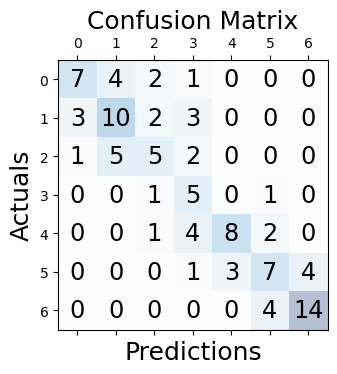

Confusion Matrix:
 [[ 7  4  2  1  0  0  0]
 [ 3 10  2  3  0  0  0]
 [ 1  5  5  2  0  0  0]
 [ 0  0  1  5  0  1  0]
 [ 0  0  1  4  8  2  0]
 [ 0  0  0  1  3  7  4]
 [ 0  0  0  0  0  4 14]]
F1 Score: 0.5650
Precision Score: 0.5889
Recall Score: 0.5600
Accuracy Score: 0.5600

            Model        F1  Precision  Recall  Accuracy
0             KNN  0.622875   0.660919    0.62      0.62
1             SVM  0.544127   0.604778    0.57      0.57
2  Neural Network  0.539136   0.562645    0.53      0.53
3         XGBoost  0.565020   0.588885    0.56      0.56


In [85]:
df["region"] -= 1  # Subtract 1 from the region column

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df.drop("region", axis=1), df["region"], test_size=0.2, random_state=42)

# Create the KNN model and fit it to the training data
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

# Create the SVM model and fit it to the training data
svm = SVC(kernel='linear', C=1, random_state=42, probability=True)
svm.fit(X_train, y_train)

# Create the neural network model and fit it to the training data
nn = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
nn.fit(X_train, y_train)

# Create the XGBoost model and fit it to the training data
xgb = XGBClassifier(random_state=42)
xgb.fit(X_train, y_train)

# Evaluate the performance of the models
models = [knn, svm, nn, xgb]
model_names = ["KNN", "SVM", "Neural Network", "XGBoost"]
# auc_scores = []
f1_scores = []
precision_scores = []
recall_scores = []
accuracy_scores = []

for i, model in enumerate(models):
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]
    
    f1 = f1_score(y_test, y_pred, average='weighted')
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    accuracy = accuracy_score(y_test, y_pred)
    
    f1_scores.append(f1)
    precision_scores.append(precision)
    recall_scores.append(recall)
    accuracy_scores.append(accuracy)
    
    print(model_names[i])
    # Plot confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    fig, ax = plt.subplots(figsize=(3.5, 3.5))
    ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.3)
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(x=j, y=i,s=cm[i, j], va='center', ha='center', size='xx-large')

    plt.xlabel('Predictions', fontsize=18)
    plt.ylabel('Actuals', fontsize=18)
    plt.title('Confusion Matrix', fontsize=18)
    plt.show()

    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
    print("F1 Score: {:.4f}".format(f1))
    print("Precision Score: {:.4f}".format(precision))
    print("Recall Score: {:.4f}".format(recall))
    print("Accuracy Score: {:.4f}\n".format(accuracy))
    
# Create a table of scores
table = pd.DataFrame({
    "Model": model_names,
    "F1": f1_scores,
    "Precision": precision_scores,
    "Recall": recall_scores,
    "Accuracy": accuracy_scores
})

print(table)

## 3.2 applying supervised learning algorithms on filtered data

### load the data

In [86]:
df = pd.read_csv("./data_set/filtered-df.csv", index_col = 0)
df = shuffle_data(df)
df

,region,comp,civil,mining
0,1,-79.117967,-95.249817,-107.010491
1,1,-76.622186,-105.947656,-111.461798
2,1,-77.027953,-97.981243,-110.678254
3,1,-77.942642,-96.834807,-107.539386
4,1,-77.377998,-97.432116,-103.557648
...,...,...,...,...
495,7,-101.014000,-86.555000,-79.342000
496,7,-106.886281,-86.655883,-77.133224
497,7,-106.023503,-86.585429,-78.719572
498,7,-105.410380,-85.812672,-77.853162


### plotting the whole data-set

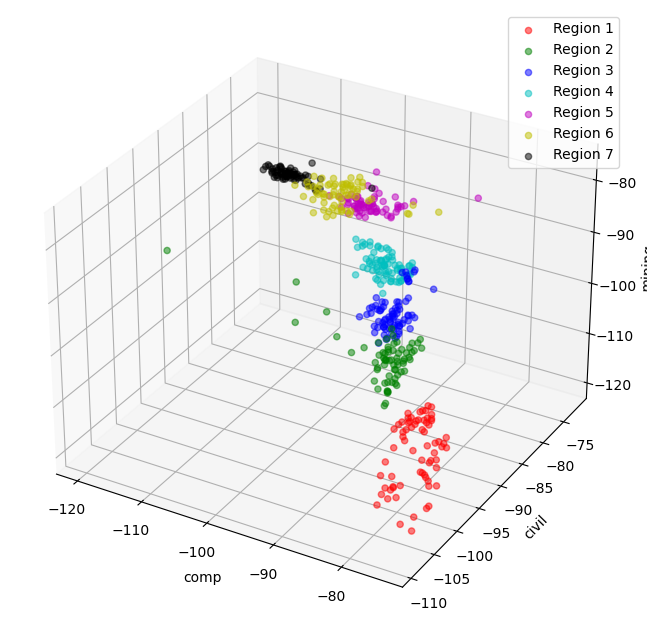

In [87]:
from mpl_toolkits.mplot3d import Axes3D

# Extract the features and target
X = df[['comp', 'civil', 'mining']]
y = df['region']

# Create a 3D scatter plot
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k']
for i, region in enumerate(y.unique()):
    ax.scatter(X[y == region]['comp'], X[y == region]['civil'], X[y == region]['mining'], 
               c=colors[i], label=f"Region {region}", alpha=0.5)

# Set the axis labels
ax.set_xlabel('comp')
ax.set_ylabel('civil')
ax.set_zlabel('mining')

# Set the legend
ax.legend()

# Show the plot
plt.show()

### applying algorithms

E:\education_and_works\educational\bachelor_project\localization\localization_codes\env\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


KNN


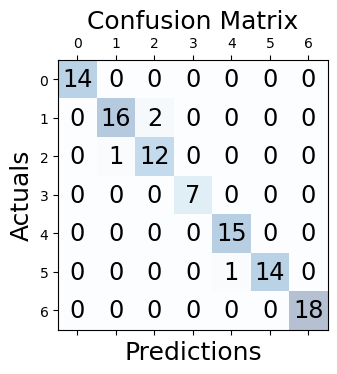

Confusion Matrix:
 [[14  0  0  0  0  0  0]
 [ 0 16  2  0  0  0  0]
 [ 0  1 12  0  0  0  0]
 [ 0  0  0  7  0  0  0]
 [ 0  0  0  0 15  0  0]
 [ 0  0  0  0  1 14  0]
 [ 0  0  0  0  0  0 18]]
F1 Score: 0.9601
Precision Score: 0.9615
Recall Score: 0.9600
Accuracy Score: 0.9600

SVM


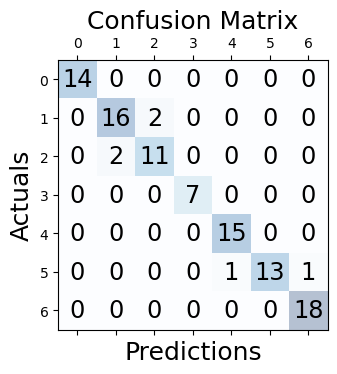

Confusion Matrix:
 [[14  0  0  0  0  0  0]
 [ 0 16  2  0  0  0  0]
 [ 0  2 11  0  0  0  0]
 [ 0  0  0  7  0  0  0]
 [ 0  0  0  0 15  0  0]
 [ 0  0  0  0  1 13  1]
 [ 0  0  0  0  0  0 18]]
F1 Score: 0.9396
Precision Score: 0.9412
Recall Score: 0.9400
Accuracy Score: 0.9400

Neural Network


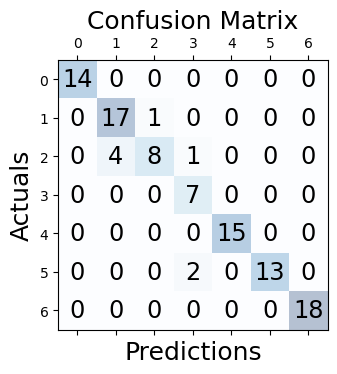

Confusion Matrix:
 [[14  0  0  0  0  0  0]
 [ 0 17  1  0  0  0  0]
 [ 0  4  8  1  0  0  0]
 [ 0  0  0  7  0  0  0]
 [ 0  0  0  0 15  0  0]
 [ 0  0  0  2  0 13  0]
 [ 0  0  0  0  0  0 18]]
F1 Score: 0.9184
Precision Score: 0.9303
Recall Score: 0.9200
Accuracy Score: 0.9200

XGBoost


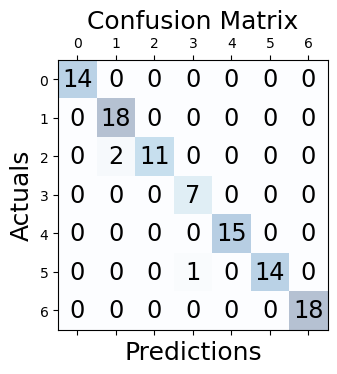

Confusion Matrix:
 [[14  0  0  0  0  0  0]
 [ 0 18  0  0  0  0  0]
 [ 0  2 11  0  0  0  0]
 [ 0  0  0  7  0  0  0]
 [ 0  0  0  0 15  0  0]
 [ 0  0  0  1  0 14  0]
 [ 0  0  0  0  0  0 18]]
F1 Score: 0.9699
Precision Score: 0.9733
Recall Score: 0.9700
Accuracy Score: 0.9700

            Model        F1  Precision  Recall  Accuracy
0             KNN  0.960116   0.961465    0.96      0.96
1             SVM  0.939582   0.941151    0.94      0.94
2  Neural Network  0.918401   0.930270    0.92      0.92
3         XGBoost  0.969854   0.973250    0.97      0.97


In [88]:
df["region"] -= 1  # Subtract 1 from the region column

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df.drop("region", axis=1), df["region"], test_size=0.2, random_state=42)

# Create the KNN model and fit it to the training data
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train, y_train)

# Create the SVM model and fit it to the training data
svm = SVC(kernel='linear', C=1, random_state=42, probability=True)
svm.fit(X_train, y_train)

# Create the neural network model and fit it to the training data
nn = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
nn.fit(X_train, y_train)

# Create the XGBoost model and fit it to the training data
xgb = XGBClassifier(random_state=42)
xgb.fit(X_train, y_train)

# Evaluate the performance of the models
models = [knn, svm, nn, xgb]
model_names = ["KNN", "SVM", "Neural Network", "XGBoost"]
# auc_scores = []
f1_scores = []
precision_scores = []
recall_scores = []
accuracy_scores = []

for i, model in enumerate(models):
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]
    
    f1 = f1_score(y_test, y_pred, average='weighted')
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    accuracy = accuracy_score(y_test, y_pred)
    
    f1_scores.append(f1)
    precision_scores.append(precision)
    recall_scores.append(recall)
    accuracy_scores.append(accuracy)
    
    print(model_names[i])
    # Plot confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    fig, ax = plt.subplots(figsize=(3.5, 3.5))
    ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.3)
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(x=j, y=i,s=cm[i, j], va='center', ha='center', size='xx-large')

    plt.xlabel('Predictions', fontsize=18)
    plt.ylabel('Actuals', fontsize=18)
    plt.title('Confusion Matrix', fontsize=18)
    plt.show()
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
    print("F1 Score: {:.4f}".format(f1))
    print("Precision Score: {:.4f}".format(precision))
    print("Recall Score: {:.4f}".format(recall))
    print("Accuracy Score: {:.4f}\n".format(accuracy))
    
# Create a table of scores
table = pd.DataFrame({
    "Model": model_names,
    "F1": f1_scores,
    "Precision": precision_scores,
    "Recall": recall_scores,
    "Accuracy": accuracy_scores
})

print(table)